In [1]:
import scanpy as sc
import numpy as np
import scipy as sp
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import colors
import seaborn as sb
from gprofiler import GProfiler

import rpy2.rinterface_lib.callbacks
import logging

import warnings

from rpy2.robjects import pandas2ri
import anndata2ri
import pandas as pd
plt.rcParams['figure.figsize']=(8,8) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(dpi=80, dpi_save=150)
sc.logging.print_versions()
import scanpy.external as sce
import scprep

/home/spuccio/miniconda3/envs/scrnaseq2/lib/python3.6/site-packages/anndata/_core/anndata.py:21: FutureWarning: pandas.core.index is deprecated and will be removed in a future version.  The public classes are available in the top-level namespace.
  from pandas.core.index import RangeIndex
/home/spuccio/miniconda3/envs/scrnaseq2/lib/python3.6/site-packages/rpy2/robjects/pandas2ri.py:34: UserWarning: pandas >= 1.0 is not supported.
  warnings.warn('pandas >= 1.0 is not supported.')


scanpy==1.4.7.dev48+g41563144 anndata==0.7.1 umap==0.4.1 numpy==1.15.4 scipy==1.4.1 pandas==1.0.3 scikit-learn==0.22.1 statsmodels==0.11.0 python-igraph==0.7.1 louvain==0.6.1


# Import Raw Data

In [2]:
adata=sc.read("/home/spuccio/datadisk2/SP007_RNA_Seq_Overexpression_MEOX1/scrnaseqmelanoma/Melanoma.txt",delimiter='\t',cache=True,first_column_names=True).transpose()

... reading from cache file cache/home-spuccio-datadisk2-SP007_RNA_Seq_Overexpression_MEOX1-scrnaseqmelanoma-Melanoma.h5ad


In [3]:
adata

AnnData object with n_obs × n_vars = 16291 × 55737 

# Import Metadata

In [4]:
Metadata = pd.read_csv("/home/spuccio/datadisk2/SP007_RNA_Seq_Overexpression_MEOX1/scrnaseqmelanoma/MelanomaNewMeta.txt",sep="\t",header=None)

In [5]:
Metadata.head()

,0,1,2,3,4,5,6,7
0,A10_P3_M11,Sample-1,Melanoma,Biopsy,SmartSeq2,Pre,P1,Responder
1,A11_P1_M11,Sample-2,Melanoma,Biopsy,SmartSeq2,Pre,P1,Responder
2,A11_P3_M11,Sample-3,Melanoma,Biopsy,SmartSeq2,Pre,P1,Responder
3,A11_P4_M11,Sample-4,Melanoma,Biopsy,SmartSeq2,Pre,P1,Responder
4,A12_P3_M11,Sample-5,Melanoma,Biopsy,SmartSeq2,Pre,P1,Responder


In [6]:
adata.obs['CellID'] = Metadata[1].to_list()
adata.obs['SampleID'] = Metadata[6].to_list()
adata.obs['Therapy'] = Metadata[5].to_list()
adata.obs['Outcome'] = Metadata[7].to_list()


In [7]:
adata

AnnData object with n_obs × n_vars = 16291 × 55737 
    obs: 'CellID', 'SampleID', 'Therapy', 'Outcome'

# Quality control

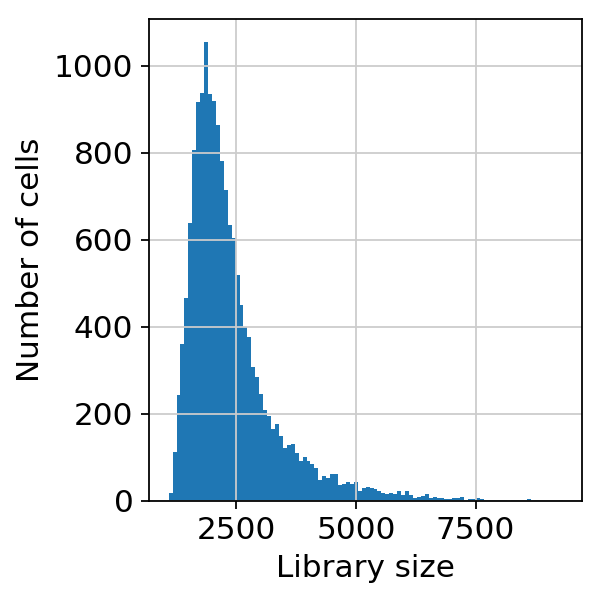

In [8]:
scprep.plot.plot_library_size(adata[:, ].to_df()>0,log=False)

/home/spuccio/.local/lib/python3.6/site-packages/scprep/select.py:362: UserWarning: No selection conditions provided. Returning all columns.
  "No selection conditions provided. " "Returning all columns.", UserWarning


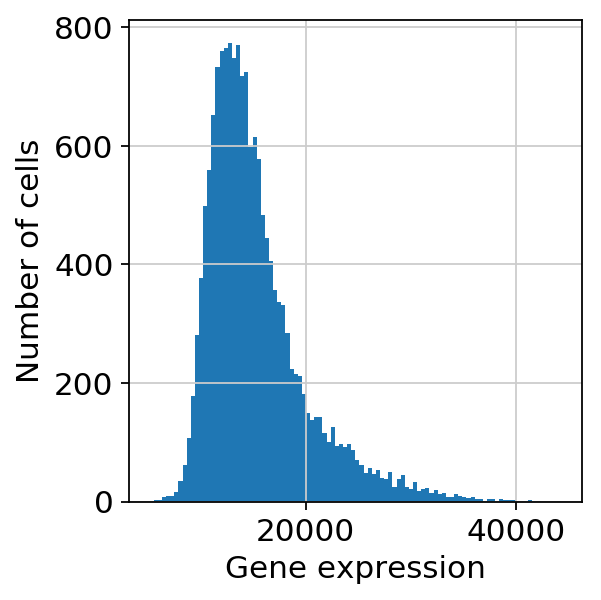

In [9]:
scprep.plot.plot_gene_set_expression(adata[:, ].to_df())

In [10]:
#sc.pp.log1p(adata)

In [11]:
adata.var_names_make_unique() 

In [12]:
# Quality control - calculate QC covariates
adata.obs['n_counts'] = adata.X.sum(1)
adata.obs['log_counts'] = np.log(adata.obs['n_counts'])
adata.obs['n_genes'] = (adata.X > 0).sum(1)

In [13]:
mito_genes = adata.var_names.str.startswith('MT-')
ribo_genes = adata.var_names.str.startswith(("RPS","RPL"))
print(sum(mito_genes))
print(sum(ribo_genes))

37
927


In [14]:
adata.obs['mt_frac'] = np.sum(
    adata[:, mito_genes].X, axis=1) / np.sum(adata.X, axis=1)

In [15]:
adata.obs['ribo_frac'] = np.sum(
    adata[:, ribo_genes].X, axis=1) / np.sum(adata.X, axis=1)

... storing 'SampleID' as categorical
... storing 'Therapy' as categorical
... storing 'Outcome' as categorical


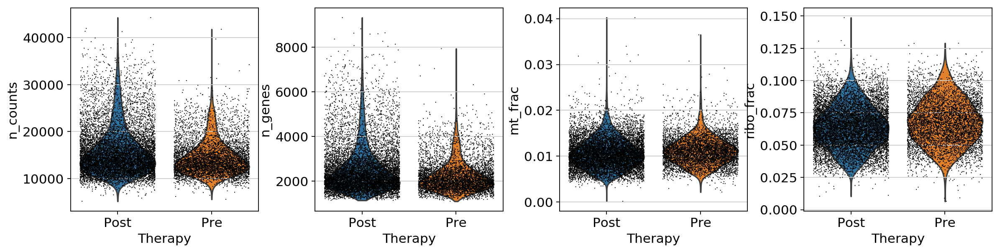

In [16]:
sc.pl.violin(adata, ['n_counts', 'n_genes','mt_frac','ribo_frac'],
             jitter=0.4, groupby = 'Therapy',save='QC_before.png')

In [17]:
print(adata.obs['Therapy'].value_counts())

Post    10363
Pre      5928
Name: Therapy, dtype: int64


In [18]:
print(adata.obs['Outcome'].value_counts())

Non-responder    10727
Responder         5564
Name: Outcome, dtype: int64


In [19]:
cc_genes_file ="/home/spuccio/datadisk2/SP007_RNA_Seq_Overexpression_MEOX1/MelanomaDurante/single-cell-tutorial/regev_lab_cell_cycle_genes.txt"

# Preprocessing

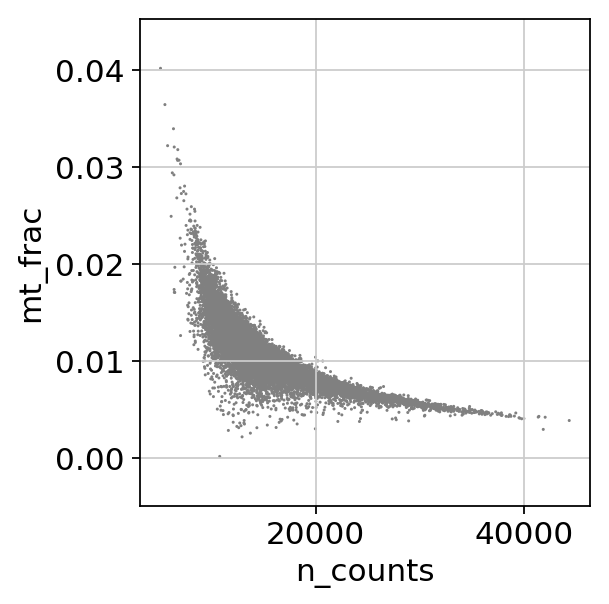

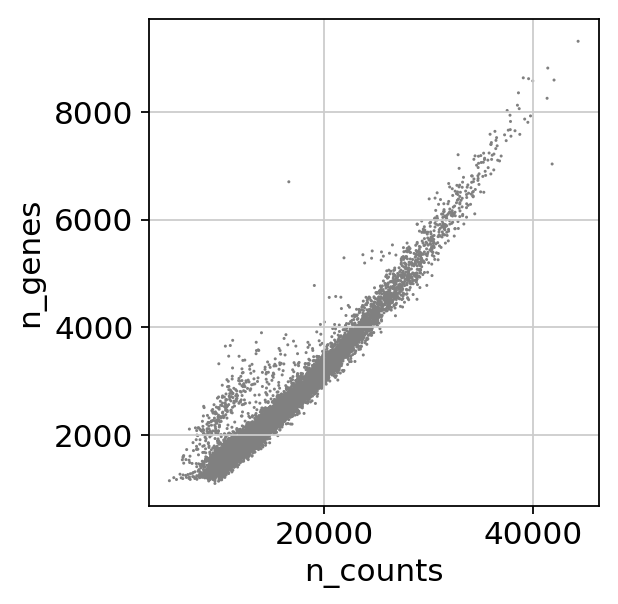

In [20]:
sc.pl.scatter(adata, x='n_counts', y='mt_frac')
sc.pl.scatter(adata, x='n_counts', y='n_genes')

/home/spuccio/.local/lib/python3.6/site-packages/scprep/select.py:362: UserWarning: No selection conditions provided. Returning all columns.
  "No selection conditions provided. " "Returning all columns.", UserWarning


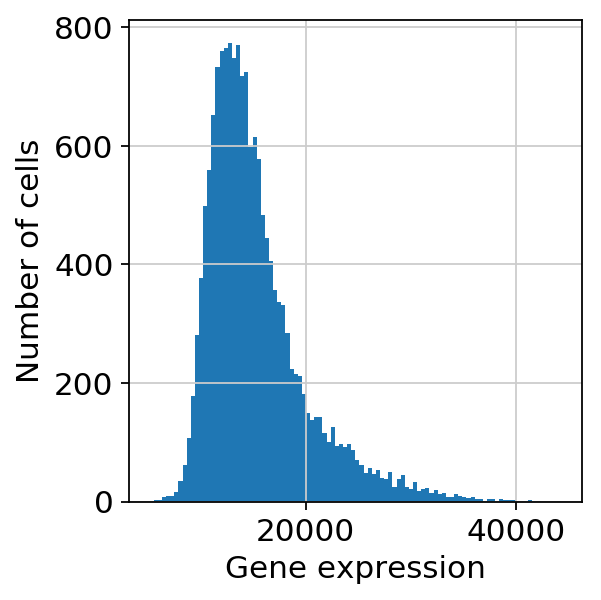

In [21]:
scprep.plot.plot_gene_set_expression(adata[:, ].to_df())

In [22]:
sc.pp.log1p(adata)

In [23]:
adata.raw = adata

In [24]:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:11)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


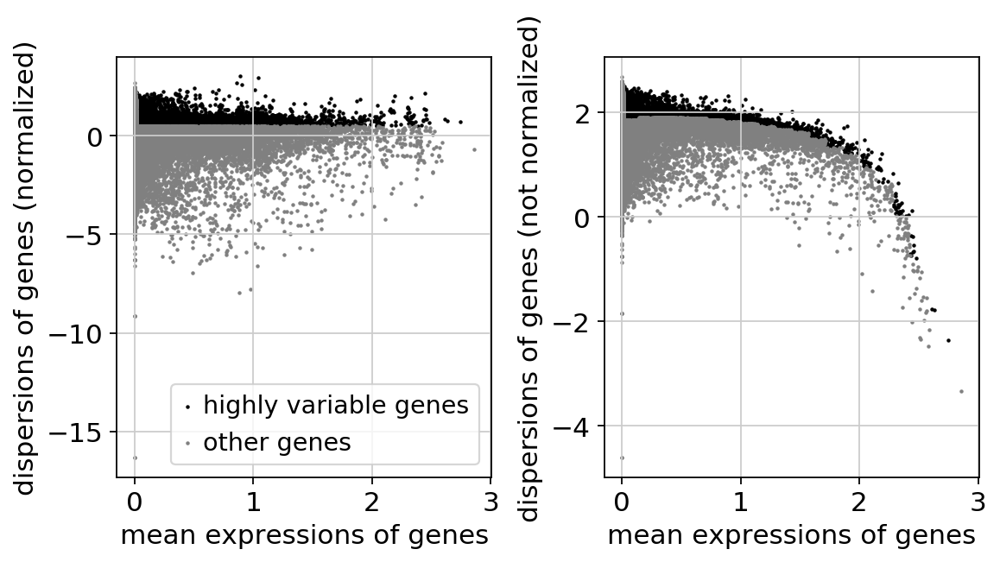

In [25]:
sc.pl.highly_variable_genes(adata)

In [26]:
sc.pp.regress_out(adata[:, adata[:,].to_df().sum(axis=0) > 0], ['n_counts', 'mt_frac'])

regressing out ['n_counts', 'mt_frac']
    finished (0:12:37)


# Principal component analysis

In [28]:
sc.tl.pca(adata,n_comps=50, svd_solver='arpack')

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:06)


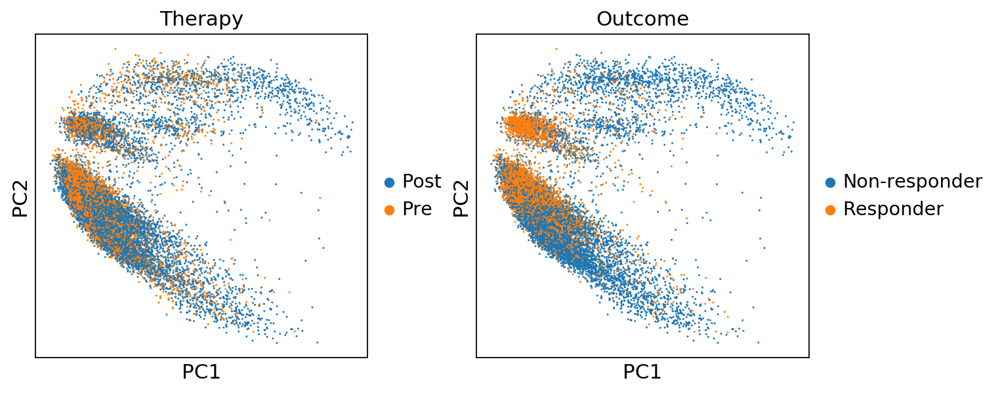

In [73]:
sc.pl.pca(adata, color=['Therapy','Outcome'])

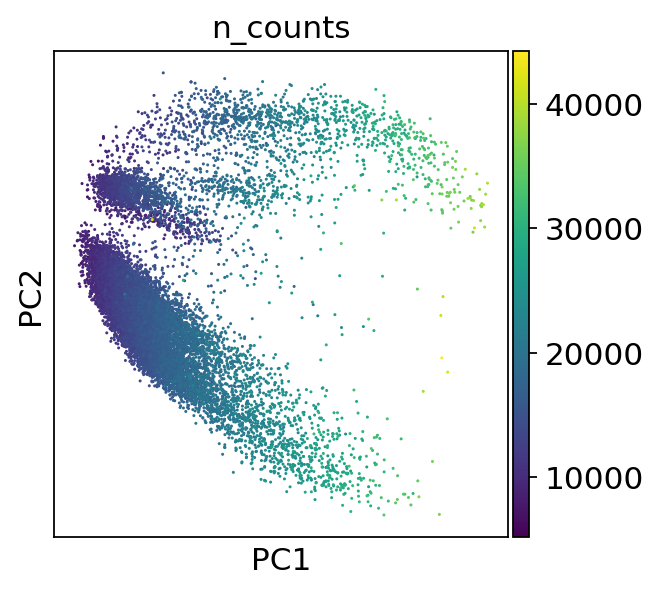

In [74]:
sc.pl.pca(adata, color='n_counts')

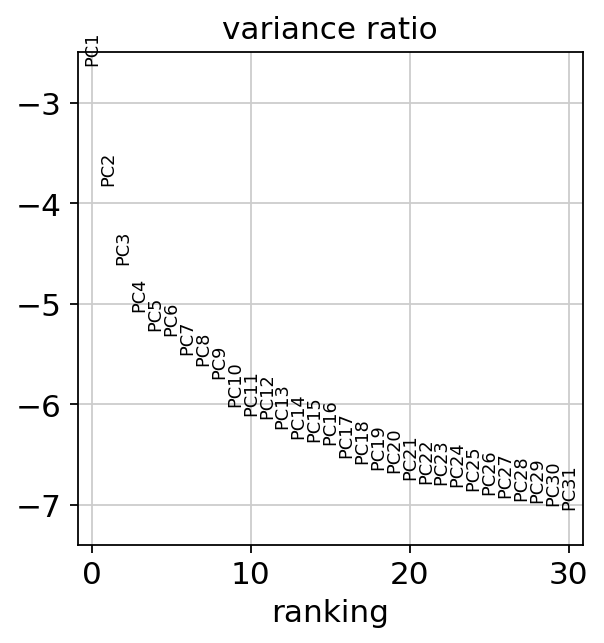

In [31]:
sc.pl.pca_variance_ratio(adata, log=True)

In [32]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:09)


# Umap

In [33]:
sc.tl.umap(adata,n_components=3,random_state=10)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


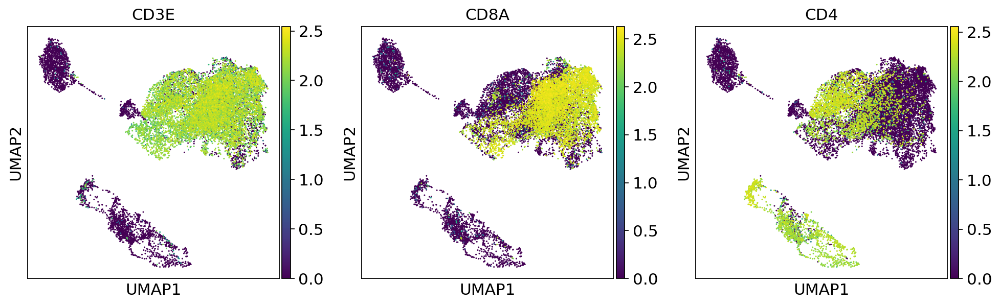

In [36]:
sc.pl.umap(adata, color=['CD3E', 'CD8A', 'CD4'])

/home/spuccio/.local/lib/python3.6/site-packages/scprep/select.py:362: UserWarning: No selection conditions provided. Returning all columns.
  "No selection conditions provided. " "Returning all columns.", UserWarning


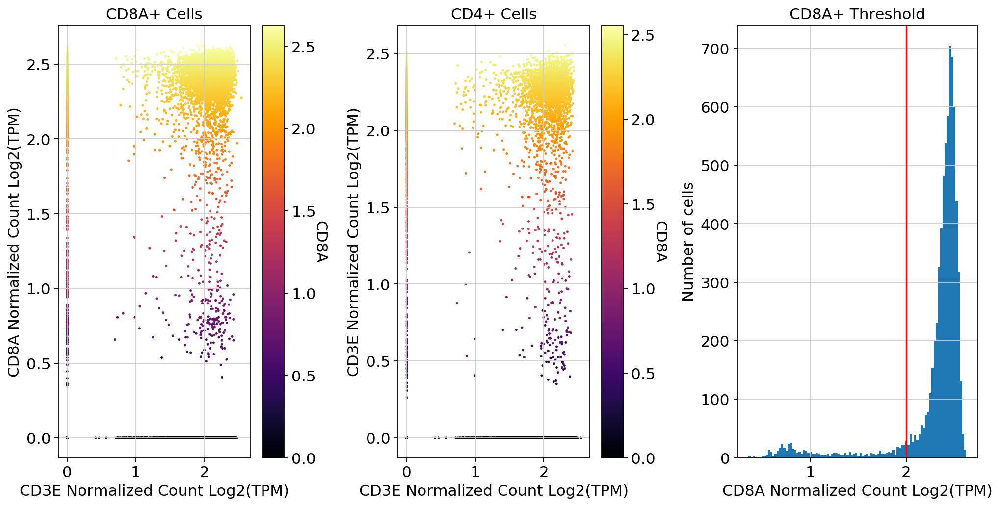

In [40]:
fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(33/2.54, 17/2.54))

scprep.plot.scatter(x=adata[:, ['CD3E']].to_df(), y=adata[:, ['CD8A']].to_df(), c=adata[:, ['CD8A']].to_df(),  ax=ax1,
                    xlabel='CD3E Normalized Count Log2(TPM)', ylabel='CD8A Normalized Count Log2(TPM)', legend_title="CD8A", title='CD8A+ Cells')

scprep.plot.scatter(x=adata[:, ['CD3E']].to_df(), y=adata[:, ['CD4']].to_df(), c=adata[:, ['CD4']].to_df(),  ax=ax2,
                    xlabel='CD3E Normalized Count Log2(TPM)', ylabel='CD3E Normalized Count Log2(TPM)', legend_title="CD8A", title='CD4+ Cells')
scprep.plot.plot_gene_set_expression(adata[:, ['CD8A']].to_df().loc[adata[:, ['CD8A']].to_df()['CD8A']>=0.001],xlabel='CD8A Normalized Count Log2(TPM)',cutoff=2,ax=ax3,title="CD8A+ Threshold")

plt.tight_layout()
plt.show()

# Magic Imputation on CD45+

In [54]:
adata_magic = adata.copy()
import scanpy.external as sce
#sce.pp.magic(adata_magic[:, adata_magic[:,].to_df().sum(axis=0) > 0.01], name_list="all_genes", knn=5)
sce.pp.magic(adata_magic, name_list="all_genes", knn=10)

computing MAGIC


/home/spuccio/.local/lib/python3.6/site-packages/magic/magic.py:472: UserWarning: Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.
  "Input matrix contains unexpressed genes. "


  Running MAGIC with `solver='exact'` on 55737-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
    finished (0:02:23)


In [55]:
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# UMAP plot of CD45+ Before Imputation plotting some marker genes

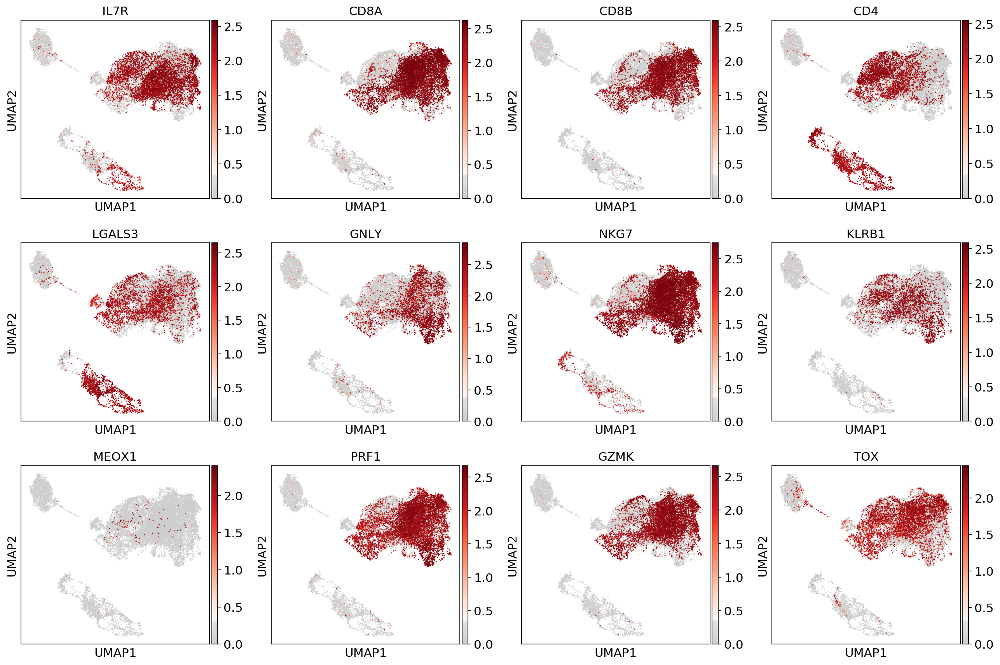

In [77]:
#sc.pp.scale(adata_fil)
sc.pl.umap(adata, color=['IL7R', 'CD8A', 'CD8B','CD4',  
                'LGALS3',  'GNLY', 'NKG7', 'KLRB1',
                'MEOX1','PRF1','GZMK','TOX'], use_raw=False, color_map=mymap)

# UMAP plot of CD45+ After Imputation plotting some marker genes

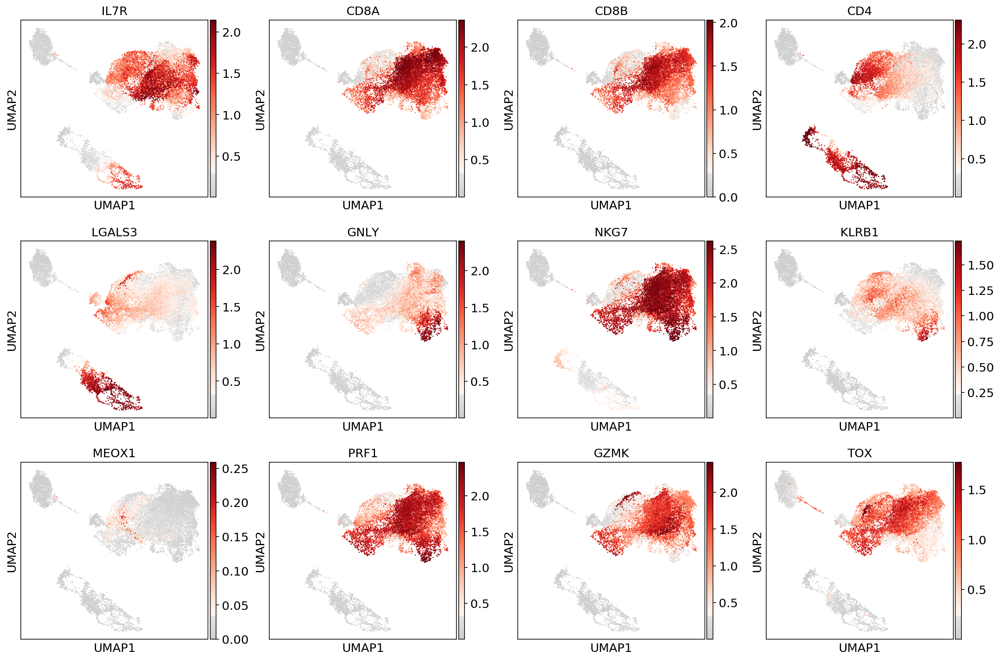

In [78]:
#sc.pp.scale(adata_fil)
sc.pl.umap(adata_magic, color=['IL7R', 'CD8A', 'CD8B','CD4',  
                'LGALS3',  'GNLY', 'NKG7', 'KLRB1',
                'MEOX1','PRF1','GZMK','TOX'], use_raw=False, color_map=mymap)

# MEOX1 Expression Before/After Imputation 

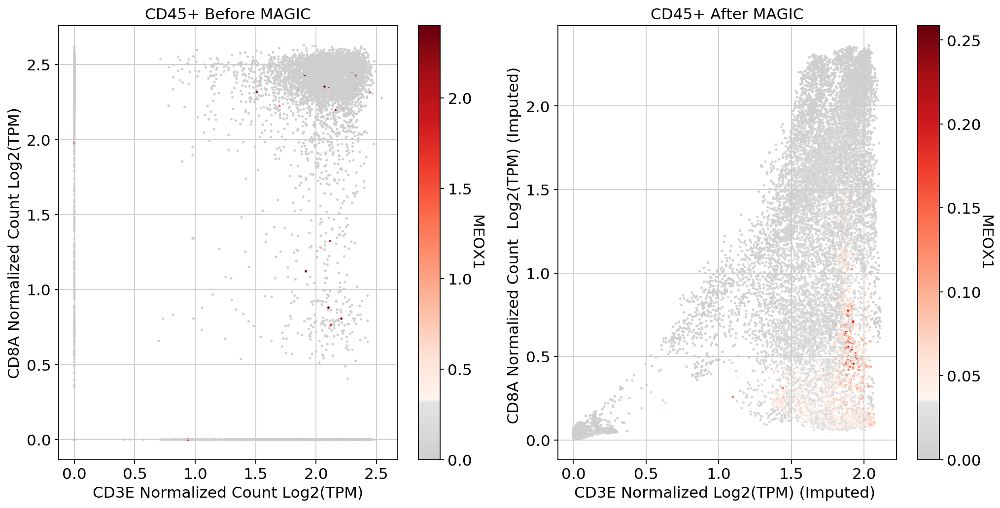

In [80]:
#fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(33/2.54, 17/2.54))
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(33/2.54, 17/2.54))
scprep.plot.scatter(x=adata[:, ['CD3E']].to_df(), y=adata[:, ['CD8A']].to_df(), c=adata[:, ['MEOX1']].to_df(),  ax=ax1,cmap=mymap,
                    xlabel='CD3E Normalized Count Log2(TPM)', ylabel='CD8A Normalized Count Log2(TPM)', legend_title="MEOX1", title='CD45+ Before MAGIC')


scprep.plot.scatter(x=adata_magic[:, ['CD3E']].to_df(), y=adata_magic[:, ['CD8A']].to_df(), c=adata_magic[:, ['MEOX1']].to_df(),cmap=mymap,  ax=ax2,
                    xlabel='CD3E Normalized Log2(TPM) (Imputed) ', ylabel='CD8A Normalized Count  Log2(TPM) (Imputed) ', legend_title="MEOX1", title='CD45+ After MAGIC')

plt.tight_layout()
plt.show()
#plt.savefig("/mnt/hpcserver1_datadisk2_spuccio/SP007_RNA_Seq_Overexpression_MEOX1/MelanomaDurante/figures/MAGIC.png")

# Filter CD8+ Cells using >=2 Log2 TPM  as threshold

In [81]:
adata_sub_CD8_POS = adata[(adata[:,'CD8A'].X>=2).flatten(), : ] 

## Guide lines suggest to start from row data and perform analysis step applied only to the selected cells

In [82]:
adata_sub_CD8_POS

View of AnnData object with n_obs × n_vars = 6423 × 55737 
    obs: 'CellID', 'SampleID', 'Therapy', 'Outcome', 'n_counts', 'log_counts', 'n_genes', 'mt_frac', 'ribo_frac'
    var: 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'Therapy_colors', 'log1p', 'pca', 'Outcome_colors', 'neighbors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [103]:
adata=sc.read("/home/spuccio/datadisk2/SP007_RNA_Seq_Overexpression_MEOX1/scrnaseqmelanoma/Melanoma.txt",delimiter='\t',cache=True,first_column_names=True).transpose()

... reading from cache file cache/home-spuccio-datadisk2-SP007_RNA_Seq_Overexpression_MEOX1-scrnaseqmelanoma-Melanoma.h5ad


In [104]:
adata.obs['CellID'] = Metadata[1].to_list()
adata.obs['SampleID'] = Metadata[6].to_list()
adata.obs['Therapy'] = Metadata[5].to_list()
adata.obs['Outcome'] = Metadata[7].to_list()

In [105]:
adata_CD8 =  adata[adata_sub_CD8_POS.obs_names].copy()

In [106]:
# Quality control - calculate QC covariates
adata_CD8.obs['n_counts'] = adata_CD8.X.sum(1)
adata_CD8.obs['log_counts'] = np.log(adata_CD8.obs['n_counts'])
adata_CD8.obs['n_genes'] = (adata_CD8.X > 0).sum(1)

In [107]:
adata_CD8.obs['mt_frac'] = np.sum(
    adata_CD8[:, mito_genes].X, axis=1) / np.sum(adata_CD8.X, axis=1)

In [108]:
adata_CD8.obs['ribo_frac'] = np.sum(
    adata_CD8[:, ribo_genes].X, axis=1) / np.sum(adata_CD8.X, axis=1)

... storing 'SampleID' as categorical
... storing 'Therapy' as categorical
... storing 'Outcome' as categorical


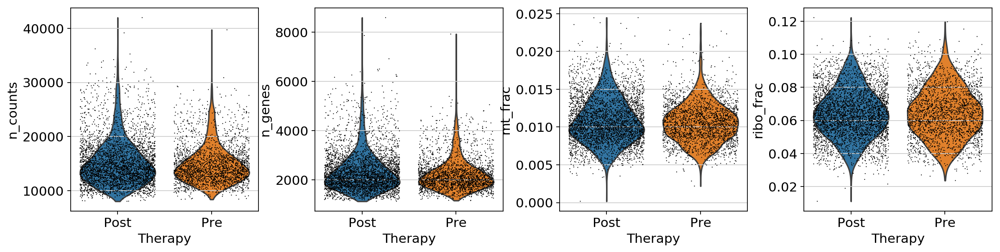

In [109]:
sc.pl.violin(adata_CD8, ['n_counts', 'n_genes','mt_frac','ribo_frac'],
             jitter=0.4, groupby = 'Therapy')

In [110]:
print(adata_CD8.obs['Therapy'].value_counts())

Post    3937
Pre     2486
Name: Therapy, dtype: int64


In [111]:
print(adata_CD8.obs['Outcome'].value_counts())

Non-responder    4459
Responder        1964
Name: Outcome, dtype: int64


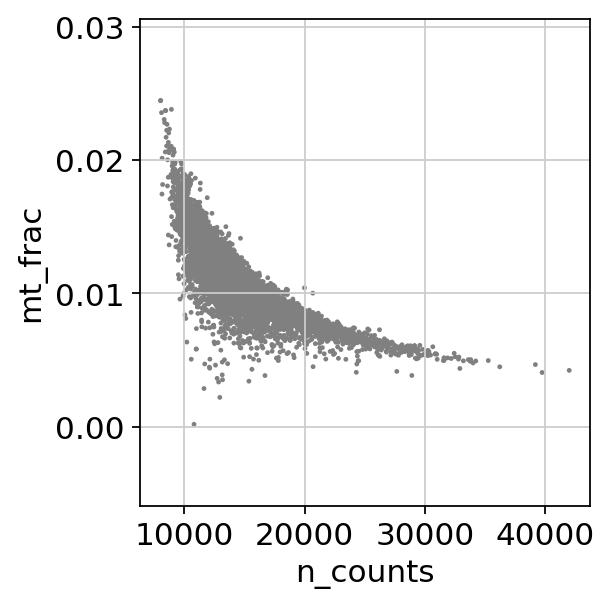

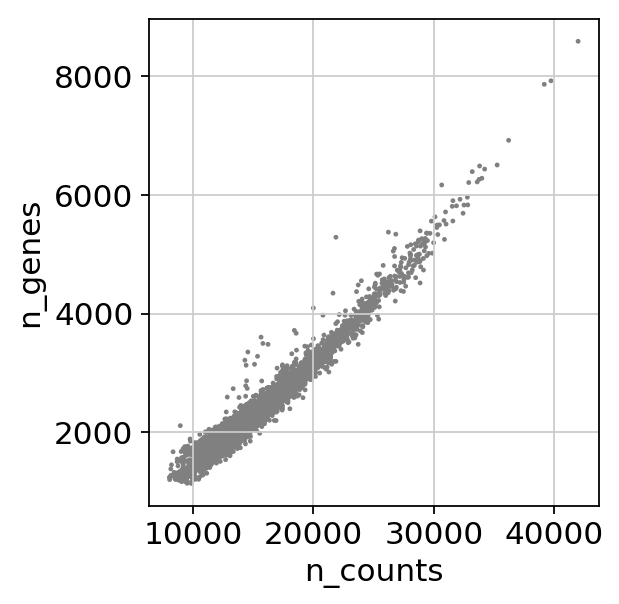

In [112]:
sc.pl.scatter(adata_CD8, x='n_counts', y='mt_frac')
sc.pl.scatter(adata_CD8, x='n_counts', y='n_genes')

In [113]:
sc.pp.log1p(adata_CD8)

In [114]:
sc.pp.highly_variable_genes(adata_CD8, min_mean=0.0125, max_mean=3, min_disp=0.5)

extracting highly variable genes
    finished (0:00:06)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


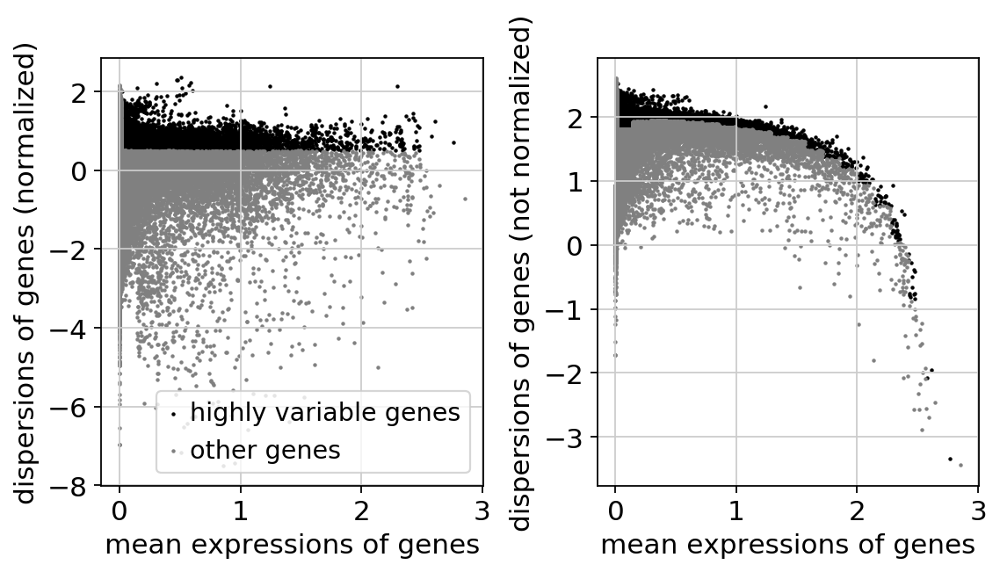

In [115]:
sc.pl.highly_variable_genes(adata_CD8)

In [116]:
sc.pp.regress_out(adata_CD8[:, adata_CD8[:,].to_df().sum(axis=0) > 0], ['n_counts', 'mt_frac'])

regressing out ['n_counts', 'mt_frac']
    finished (0:05:33)


In [117]:
sc.tl.pca(adata_CD8,n_comps=50, svd_solver='arpack')

    on highly variable genes
computing PCA with n_comps = 50
    finished (0:00:04)


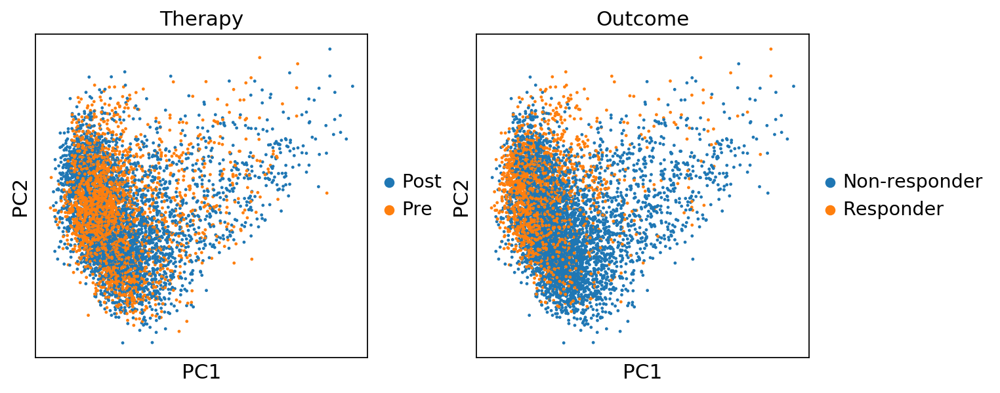

In [118]:
sc.pl.pca(adata_CD8, color=['Therapy','Outcome'])

In [120]:
sc.pp.neighbors(adata_CD8, n_neighbors=10, n_pcs=40)

computing neighbors
    using 'X_pca' with n_pcs = 40
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)


In [121]:
sc.tl.umap(adata_CD8,n_components=3,random_state=10)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


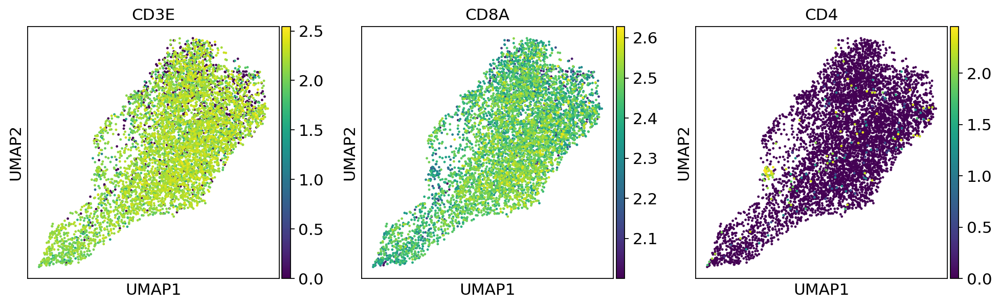

In [122]:
sc.pl.umap(adata_CD8, color=['CD3E', 'CD8A', 'CD4'])

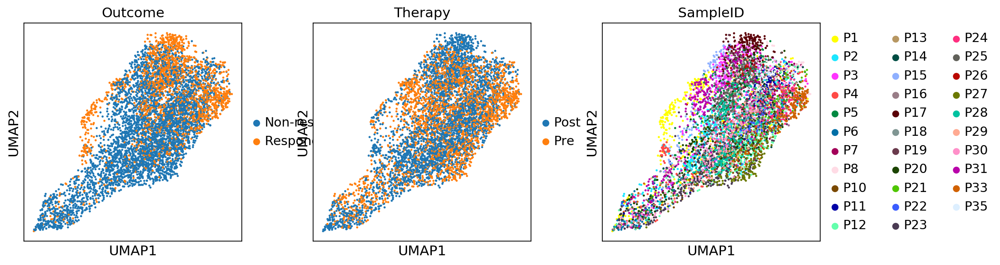

In [136]:
sc.pl.umap(adata_CD8, color=['Outcome','Therapy','SampleID'])

# Imputation of CD8+ Cells

In [123]:
adata_magic_CD8 = adata_CD8.copy()
import scanpy.external as sce
#sce.pp.magic(adata_magic[:, adata_magic[:,].to_df().sum(axis=0) > 0.01], name_list="all_genes", knn=5)
sce.pp.magic(adata_magic_CD8, name_list="all_genes", knn=5)

computing MAGIC


/home/spuccio/.local/lib/python3.6/site-packages/magic/magic.py:472: UserWarning: Input matrix contains unexpressed genes. Please remove them prior to running MAGIC.
  "Input matrix contains unexpressed genes. "


  Running MAGIC with `solver='exact'` on 55737-dimensional data may take a long time. Consider denoising specific genes with `genes=<list-like>` or using `solver='approximate'`.
    finished (0:00:29)


# UMAP plot of CD8+ Before Imputation plotting some marker genes

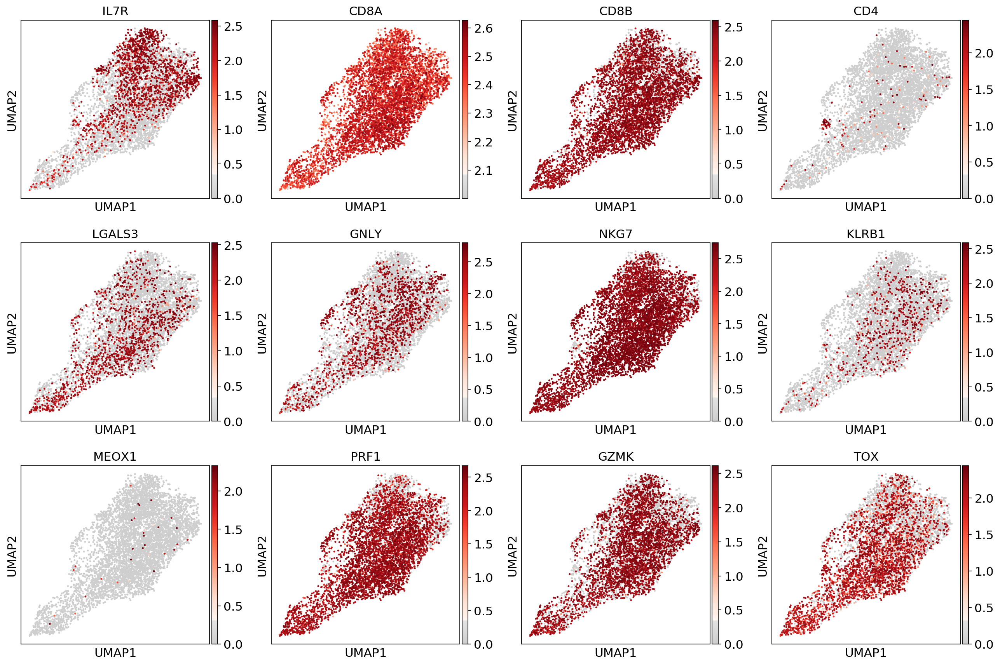

In [124]:
#sc.pp.scale(adata_fil)
sc.pl.umap(adata_CD8, color=['IL7R', 'CD8A', 'CD8B','CD4',  
                'LGALS3',  'GNLY', 'NKG7', 'KLRB1',
                'MEOX1','PRF1','GZMK','TOX'], use_raw=False, color_map=mymap)

# UMAP plot of CD8+ After Imputation plotting some marker genes

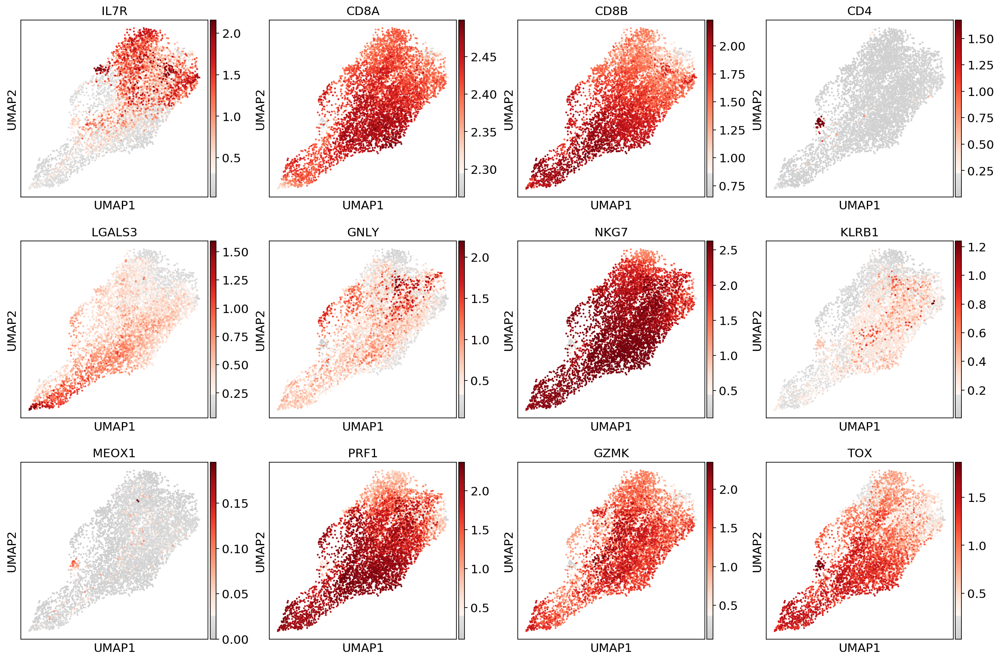

In [125]:
#sc.pp.scale(adata_fil)
sc.pl.umap(adata_magic_CD8, color=['IL7R', 'CD8A', 'CD8B','CD4',  
                'LGALS3',  'GNLY', 'NKG7', 'KLRB1',
                'MEOX1','PRF1','GZMK','TOX'], use_raw=False, color_map=mymap)

# MEOX1 Expression Before/After Imputation 

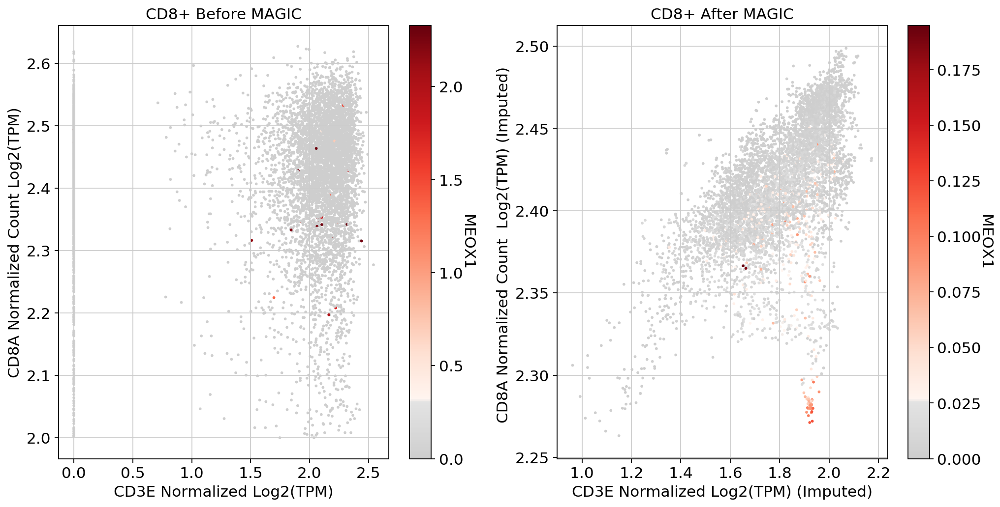

In [157]:
#fig, (ax1, ax2,ax3) = plt.subplots(1,3, figsize=(33/2.54, 17/2.54))
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(33/2.54, 17/2.54))
scprep.plot.scatter(x=adata_CD8[:, ['CD3E']].to_df(), y=adata_CD8[:, ['CD8A']].to_df(), c=adata_CD8[:, ['MEOX1']].to_df(),  ax=ax1,cmap=mymap,
                    xlabel='CD3E Normalized Log2(TPM)', ylabel='CD8A Normalized Count Log2(TPM)', legend_title="MEOX1", title='CD8+ Before MAGIC')


scprep.plot.scatter(x=adata_magic_CD8[:, ['CD3E']].to_df(), y=adata_magic_CD8[:, ['CD8A']].to_df(), c=adata_magic_CD8[:, ['MEOX1']].to_df(),cmap=mymap,  ax=ax2,
                    xlabel='CD3E Normalized Log2(TPM) (Imputed)', ylabel='CD8A Normalized Count  Log2(TPM) (Imputed) ', legend_title="MEOX1", title='CD8+ After MAGIC')

plt.tight_layout()
plt.show()

# Analysis Metrics

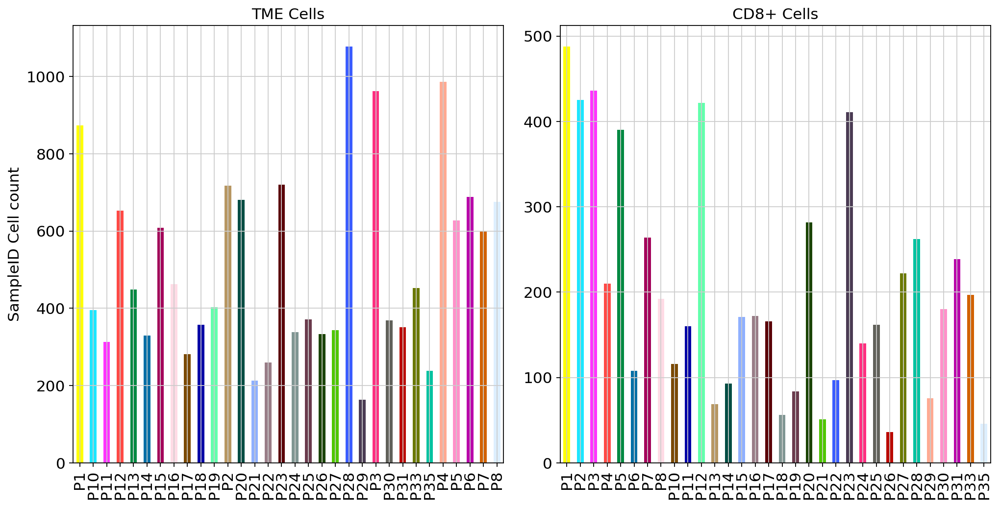

In [151]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(33/2.54, 17/2.54))
adata.obs['SampleID'].value_counts().sort_index().plot.bar(x=adata.obs['SampleID'].value_counts().sort_index().index, y=adata.obs['SampleID'].value_counts().sort_index(),color=adata_CD8.uns['SampleID_colors'],ax = ax1)
adata_CD8.obs['SampleID'].value_counts().sort_index().plot.bar(x=adata_CD8.obs['SampleID'].value_counts().sort_index().index, y=adata_CD8.obs['SampleID'].value_counts().sort_index(),color=adata_CD8.uns['SampleID_colors'],ax = ax2)
ax1.set_ylabel("SampleID Cell count")
ax1.set_title("TME Cells")
ax2.set_title("CD8+ Cells")


plt.tight_layout()
plt.show()

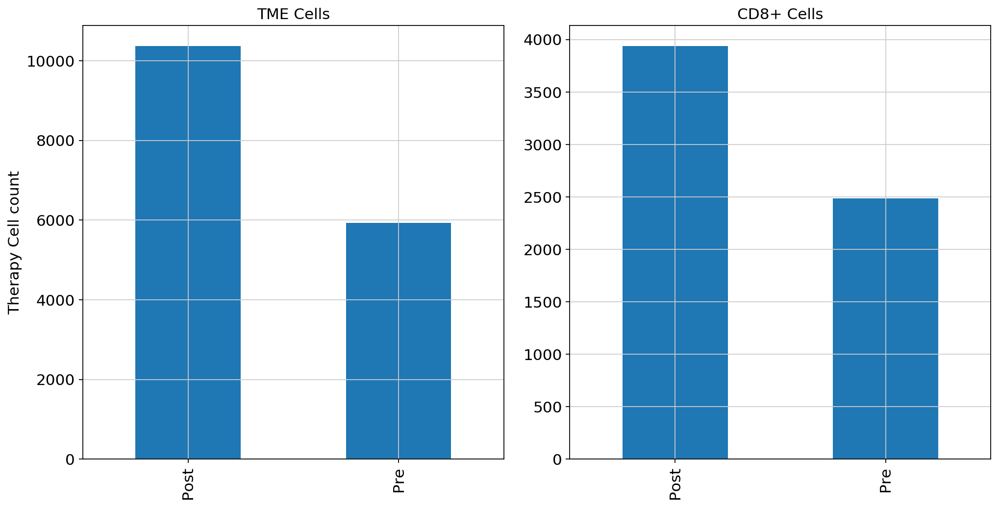

In [154]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(33/2.54, 17/2.54))
adata.obs['Therapy'].value_counts().sort_index().plot.bar(x=adata.obs['Therapy'].value_counts().sort_index().index, y=adata.obs['Therapy'].value_counts().sort_index(),ax = ax1)
adata_CD8.obs['Therapy'].value_counts().sort_index().plot.bar(x=adata_CD8.obs['Therapy'].value_counts().sort_index().index, y=adata_CD8.obs['Therapy'].value_counts().sort_index(),ax = ax2)
ax1.set_ylabel("Therapy Cell count")
ax1.set_title("TME Cells")
ax2.set_title("CD8+ Cells")

plt.tight_layout()
plt.show()

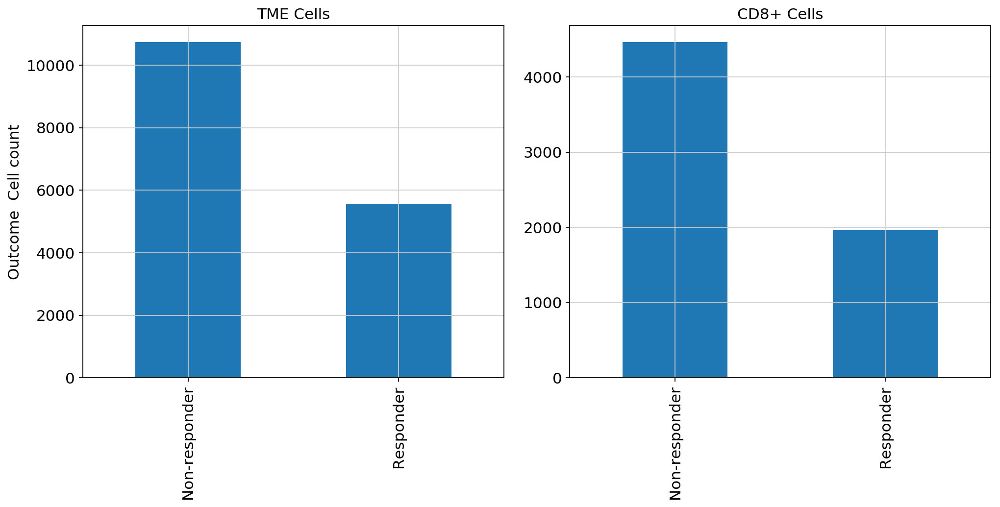

In [155]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(33/2.54, 17/2.54))
adata.obs['Outcome'].value_counts().sort_index().plot.bar(x=adata.obs['Outcome'].value_counts().sort_index().index, y=adata.obs['Outcome'].value_counts().sort_index(),rot=90,ax = ax1)
adata_CD8.obs['Outcome'].value_counts().sort_index().plot.bar(x=adata_CD8.obs['Outcome'].value_counts().sort_index().index, y=adata_CD8.obs['Outcome'].value_counts().sort_index(),rot=90,ax = ax2)
ax1.set_ylabel("Outcome  Cell count")
ax1.set_title("TME Cells")
ax2.set_title("CD8+ Cells")
plt.tight_layout()
plt.show()